### Read data into PySpark Dataframe.

In [ ]:
from pyspark.sql.types import *
import pyspark
from pyspark.sql import SparkSession
from pyspark.sql import functions as F
import pandas as pd

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)

spark = SparkSession.builder.getOrCreate()

In [ ]:
profiles = spark.read.parquet('/linkedin/people')
sampled_profiles = profiles.sample(withReplacement=False, fraction=0.01, seed=42) # small data
sampled_profiles.printSchema()

root
 |-- about: string (nullable = true)
 |-- avatar: string (nullable = true)
 |-- certifications: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- meta: string (nullable = true)
 |    |    |-- subtitle: string (nullable = true)
 |    |    |-- title: string (nullable = true)
 |-- city: string (nullable = true)
 |-- country_code: string (nullable = true)
 |-- current_company: struct (nullable = true)
 |    |-- company_id: string (nullable = true)
 |    |-- industry: string (nullable = true)
 |    |-- link: string (nullable = true)
 |    |-- name: string (nullable = true)
 |    |-- title: string (nullable = true)
 |-- current_company:company_id: string (nullable = true)
 |-- current_company:name: string (nullable = true)
 |-- education: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- degree: string (nullable = true)
 |    |    |-- end_year: string (nullable = true)
 |    |    |-- field: string (nullable = true

In [ ]:
companies = spark.read.parquet('/linkedin/companies')
sampled_companies = companies.sample(withReplacement=False, fraction=0.01, seed=42)  # small data
sampled_companies.printSchema()

root
 |-- about: string (nullable = true)
 |-- affiliated: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- Links: string (nullable = true)
 |    |    |-- location: string (nullable = true)
 |    |    |-- subtitle: string (nullable = true)
 |    |    |-- title: string (nullable = true)
 |-- company_id: string (nullable = true)
 |-- company_size: string (nullable = true)
 |-- country_code: string (nullable = true)
 |-- crunchbase_url: string (nullable = true)
 |-- employees: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- img: string (nullable = true)
 |    |    |-- link: string (nullable = true)
 |    |    |-- subtitle: string (nullable = true)
 |    |    |-- title: string (nullable = true)
 |-- employees_in_linkedin: long (nullable = true)
 |-- followers: long (nullable = true)
 |-- formatted_locations: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- founded: long (nullable = true

## Users Similarity

In [ ]:
# # get distinct languages in data, no need to run again

# # Explode the array column to separate language-proficiency pairs into multiple rows
# exploded_df = profiles.select(explode("languages").alias("language_struct"))

# # Extract the 'title' field from the struct as the language
# language_df = exploded_df.select(F.lower("language_struct.title"))

# # Extract distinct languages
# distinct_languages = language_df.distinct().rdd.flatMap(lambda x: x).collect()

# # Print the list of distinct languages
# for distinct_language in distinct_languages:   
#     print(distinct_language)

In [ ]:
# Extracted languages of interest with help oh Chat GPT

top_spoken_languages_usa_dict = {
    "english": ["english"],
    "spanish": ["spanish"],
    "chinese": ["chinese", "mandarin", "cantonese", "taishanese", "wenzhounese", "shanghainese"],
    "tagalog": ["tagalog"],
    "vietnamese": ["vietnamese", "hmong", "thai", "lao", "khmer", "burmese", "javanese", "sundanese"],
    "french": ["french"],
    "korean": ["korean"],
    "german": ["german", "yiddish"],
    "arabic": ["arabic"],
    "russian": ["russian"],
    "italian": ["italian"],
    "portuguese": ["portuguese"],
    "polish": ["polish"],
    "hindi": ["hindi", "bengali", "punjabi", "marathi", "odia", "assamese", "sindhi", "nepali", "sinhala", "kannada", "malayalam"],
    "japanese": ["japanese"],
    "urdu": ["urdu"],
    "gujarati": ["gujarati"],
    "persian": ["persian", "farsi"],
    "telugu": ["telugu"],
    "tamil": ["tamil"],
    "greek": ["greek"],
    "armenian": ["armenian"],
    "haitian creole": ["haitian creole"],
    "filipino": ["filipino"],
    "bengali": ["bengali"],
    "panjabi": ["panjabi"],
    "kannada": ["kannada"],
    "malayalam": ["malayalam"],
    "marathi": ["marathi"],
    "odia": ["odia"],
    "sindhi": ["sindhi"],
    "sinhala": ["sinhala"],
    "assamese": ["assamese"],
    "nepali": ["nepali"],
    "haryanvi": ["haryanvi"],
    "rajasthani": ["rajasthani"],
    "chhattisgarhi": ["chhattisgarhi"],
    "maithili": ["maithili"],
    "bhojpuri": ["bhojpuri"],
    "magahi": ["magahi"],
    "haryanvi": ["haryanvi"],
    "kashmiri": ["kashmiri"],
    "rajasthani": ["rajasthani"],
    "hebrew": ["hebrew"]
}


In [ ]:
from pyspark.sql.functions import explode, col, size, udf, when, array, avg, collect_list, expr, sort_array
from pyspark.ml.linalg import Vectors, VectorUDT
from pyspark.ml.feature import VectorAssembler
from pyspark.sql.window import Window
import re
import math

In [ ]:
# Define data preprocessing functions
def clean_text(text):
    # Convert text to lowercase
    text = text.lower()
    # Remove punctuation
    text = re.sub(r'[^\w\s]', '', text)
    return text

# Register UDF for data preprocessing
clean_text_udf = udf(clean_text, StringType())

In [ ]:
profiles_features = profiles.select(col('id'),
                                    col("current_company")["name"].alias("current_company_name"),
                                    col('recommendations_count'),
                                    col('volunteer_experience'),
                                    col('languages'),
                                    col('education'),
                                    col('experience')).na.drop(subset=['current_company_name']).withColumn('current_company_name', clean_text_udf('current_company_name'))

cols = profiles_features.columns

In [ ]:
# udf for company_months calculation
def calc_months(duration):

    if duration == '':
        return 0
    
    if "less" in duration:
        months = 6
    else:
        nums = re.findall(r'\d+', duration)
        nums = [int(i) for i in nums]
        if len(nums) == 1:
            if "year" in duration:
                months = 12*nums[0]
            else:
                months = nums[0]
        else:
            months = 12*nums[0] + nums[1]
    return months

calc_months_udf = udf(calc_months, IntegerType())

# Define the function to check if a language is mentioned
def check_language_mentioned(languages):
    lg_str = str(languages).lower()
    mentioned_languages = [1 if any(lg in lg_str for lg in lgs_lst) else 0 for lgs_lst in top_spoken_languages_usa_dict.values()]
    return Vectors.dense(mentioned_languages)

# Create a UDF from the function
check_language_mentioned_udf = udf(check_language_mentioned, VectorUDT())

def check_degree(education):
    ed_str = str(education).replace(".", "").lower().replace(' ', '+').replace(',', '+').replace(')', '+').replace('(', '+').replace('\'', '+').replace('"', '+')

    hs_fromats = ['hs', 'high+school']
    associate_formats = ['associate', '+as+', 'eod']
    bachelor_formats = ['bachelor', 'ba+', '+bs', '+be+']
    master_formats = ['master', 'ma+', '+ms', '+me+', 'mba']
    doctor_formats = ['doctor', 'md', 'phd', '+dr+']

    if any(s in ed_str for s in doctor_formats):
        return Vectors.dense([1, 1, 1, 1, 1])
    
    if any(s in ed_str for s in master_formats):
        return Vectors.dense([1, 1, 1, 1, 0])
    
    if any(s in ed_str for s in bachelor_formats):
        return Vectors.dense([1, 1, 1, 0, 0])
    
    if any(s in ed_str for s in associate_formats):
        return Vectors.dense([1, 1, 0, 0, 0])
    
    if any(s in ed_str for s in hs_fromats):
        return Vectors.dense([1, 0, 0, 0, 0])
    
    return Vectors.dense([0, 0, 0, 0, 0])

# Create a UDF from the function
check_degree_udf = udf(check_degree, VectorUDT())


In [ ]:
## Add years_education (adjusted code from hw1)

profiles_features_adjusted = profiles_features.withColumn('education_exp', explode('education')).withColumn('start_year', col('education_exp').getField('start_year')).withColumn('end_year', col('education_exp').getField('end_year')).drop('education_exp').na.fill(0, subset=['start_year', 'end_year'])
profiles_features_adjusted = profiles_features_adjusted.withColumn('ed_period', col('end_year') - col('start_year')).drop('start_year', 'end_year')
profiles_features_adjusted = profiles_features_adjusted.groupBy(*cols).agg(F.sum(col('ed_period')).alias('years_education'))

## Add years_experience (adjusted code from hw1)

# separate experience items to different rows and save necessary information
profiles_features_adjusted = profiles_features_adjusted.withColumn("exp", explode("experience")).withColumn('duration_short', col("exp").getField('duration_short')).drop('experience', 'exp').na.fill('', subset=['duration_short'])
# Add company_month 
profiles_features_adjusted = profiles_features_adjusted.withColumn('company_months', calc_months_udf('duration_short')).drop('duration_short')
# Sum
profiles_features_adjusted = profiles_features_adjusted.groupBy(*list(set(profiles_features_adjusted.columns) - set(['company_months']))).agg(F.sum(F.col('company_months')) / 12).withColumnRenamed('(sum(company_months) / 12)', 'years_experience')


## Add is_volunteer_experience
profiles_features_adjusted = profiles_features_adjusted.withColumn('is_volunteer_experience', when(size('volunteer_experience') > 0, 1).otherwise(0)).drop('volunteer_experience')

## Apply the UDFs to create new binary columns

profiles_features_adjusted = profiles_features_adjusted.withColumn("mentioned_languages", check_language_mentioned_udf(profiles_features_adjusted["languages"])).drop('languages')
profiles_features_adjusted = profiles_features_adjusted.withColumn("degree", check_degree_udf(profiles_features_adjusted["education"])).drop('education')

In [ ]:
profiles_features_adjusted = profiles_features_adjusted.select('id', 'current_company_name', 'years_education', 'years_experience', 'recommendations_count', 'is_volunteer_experience', 'mentioned_languages', 'degree')
profiles_features_adjusted.display()

id,current_company_name,years_education,years_experience,recommendations_count,is_volunteer_experience,mentioned_languages,degree
debbie-demarais-42475317,san diego state university,4.0,12.5,null,0,"Map(vectorType -> dense, length -> 42, values -> List(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))","Map(vectorType -> dense, length -> 5, values -> List(1.0, 1.0, 1.0, 0.0, 0.0))"
terry-gagne-7781b472,photoshop artist and tutor,2.0,15.083333333333334,null,0,"Map(vectorType -> dense, length -> 42, values -> List(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))","Map(vectorType -> dense, length -> 5, values -> List(1.0, 1.0, 0.0, 0.0, 0.0))"
sam-mcintire-4577951b7,us army,null,5.0,null,0,"Map(vectorType -> dense, length -> 42, values -> List(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))","Map(vectorType -> dense, length -> 5, values -> List(1.0, 1.0, 1.0, 0.0, 0.0))"
geoff-lutley-ba920221,lia auto group,4.0,0.0,null,0,"Map(vectorType -> dense, length -> 42, values -> List(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))","Map(vectorType -> dense, length -> 5, values -> List(1.0, 1.0, 1.0, 0.0, 0.0))"
barron-anschutz-a2782b93,tenable inc,4.0,32.0,null,0,"Map(vectorType -> dense, length -> 42, values -> List(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))","Map(vectorType -> dense, length -> 5, values -> List(1.0, 1.0, 1.0, 0.0, 0.0))"
yolanda-mckenzie-68aa1124,pathways mariposa,3.0,34.75,null,0,"Map(vectorType -> dense, length -> 42, values -> List(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))","Map(vectorType -> dense, length -> 5, values -> List(0.0, 0.0, 0.0, 0.0, 0.0))"
chester-umbles-67201b58,tjmaxx,2.0,7.0,2,0,"Map(vectorType -> dense, length -> 42, values -> List(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))","Map(vectorType -> dense, length -> 5, values -> List(0.0, 0.0, 0.0, 0.0, 0.0))"
tanya-first-62b85492,be,5.0,27.5,null,0,"Map(vectorType -> dense, length -> 42, values -> List(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0))","Map(vectorType -> dense, length -> 5, values -> List(1.0, 1.0, 1.0, 0.0, 0.0))"
sultan-basel,foxconn industrial internet usa,9.0,6.333333333333333,null,1,"Map(vectorType -> dense, length -> 42, values -> List(1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0))","Map(vectorType -> dense, length -> 5, values -> List(1.0, 1.0, 1.0, 1.0, 0.0))"
russell-melchert-a0889056,umkc,9.0,28.333333333333332,null,0,"Map(vectorType -> dense, length -> 42, values -> List(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [ ]:
profiles_features_adjusted.count()

Out[34]: 1243498

In [ ]:
vector_features = ['mentioned_languages', 'degree']
features = ['years_education', 'years_experience', 'recommendations_count', 'is_volunteer_experience']

# Assemble the feature vector
assembler = VectorAssembler(inputCols=features, outputCol="temp_features")
df_with_features = assembler.transform(profiles_features_adjusted.na.fill(0))

assembler = VectorAssembler(inputCols=['temp_features']+vector_features, outputCol="features")
df_with_features = assembler.transform(df_with_features)

# Select id, current_company_id, and the feature vector
final_feature_df = df_with_features.select("id", "current_company_name", "features")

# Show the resulting DataFrame
final_feature_df.display()

id,current_company_name,features
debbie-demarais-42475317,san diego state university,"Map(vectorType -> sparse, length -> 51, indices -> List(0, 1, 46, 47, 48), values -> List(4.0, 12.5, 1.0, 1.0, 1.0))"
terry-gagne-7781b472,photoshop artist and tutor,"Map(vectorType -> sparse, length -> 51, indices -> List(0, 1, 46, 47), values -> List(2.0, 15.083333333333334, 1.0, 1.0))"
sam-mcintire-4577951b7,us army,"Map(vectorType -> sparse, length -> 51, indices -> List(1, 46, 47, 48), values -> List(5.0, 1.0, 1.0, 1.0))"
geoff-lutley-ba920221,lia auto group,"Map(vectorType -> sparse, length -> 51, indices -> List(0, 46, 47, 48), values -> List(4.0, 1.0, 1.0, 1.0))"
barron-anschutz-a2782b93,tenable inc,"Map(vectorType -> sparse, length -> 51, indices -> List(0, 1, 46, 47, 48), values -> List(4.0, 32.0, 1.0, 1.0, 1.0))"
yolanda-mckenzie-68aa1124,pathways mariposa,"Map(vectorType -> sparse, length -> 51, indices -> List(0, 1), values -> List(3.0, 34.75))"
chester-umbles-67201b58,tjmaxx,"Map(vectorType -> sparse, length -> 51, indices -> List(0, 1, 2), values -> List(2.0, 7.0, 2.0))"
tanya-first-62b85492,be,"Map(vectorType -> sparse, length -> 51, indices -> List(0, 1, 46, 47, 48), values -> List(5.0, 27.5, 1.0, 1.0, 1.0))"
sultan-basel,foxconn industrial internet usa,"Map(vectorType -> sparse, length -> 51, indices -> List(0, 1, 3, 4, 12, 45, 46, 47, 48, 49), values -> List(9.0, 6.333333333333333, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))"
russell-melchert-a0889056,umkc,"Map(vectorType -> sparse, length -> 51, indices -> List(0, 1, 46, 47, 48, 49, 50), values -> List(9.0, 28.333333333333332, 1.0, 1.0, 1.0, 1.0, 1.0))"


In [ ]:
final_feature_df.write.option("header", "true").parquet('/FileStore/shared_uploads/naomi.derel@campus.technion.ac.il/user_feature_vectors.parquet')

In [ ]:
sparse_to_array_udf = udf(lambda v: v.toArray().tolist(), ArrayType(DoubleType()))
df_by_company = final_feature_df.withColumn("features", sparse_to_array_udf(col("features")))

n = len(final_feature_df.select("features").first()[0])

df_by_company = df_by_company.groupBy('current_company_name').agg(array(*[avg(col("features")[i]) for i in range(n)]).alias('mean_vec'), F.count('id').alias('num_emp'), collect_list("features").alias("vecs")).select("current_company_name", "mean_vec", 'num_emp', explode("vecs").alias("features"))

df_by_company = df_by_company.filter(col('num_emp') >= 20).withColumn("excluded_mean",
    expr("transform(mean_vec, (x, i) -> (num_emp / (num_emp - 1))*x - (1 / (num_emp-1)) * features[i])"))

# Define cosine similarity function
def cosine_similarity(vector1, vector2):
    dot_product = sum(x * y for x, y in zip(vector1, vector2))
    magnitude_vector1 = math.sqrt(sum(x ** 2 for x in vector1))
    magnitude_vector2 = math.sqrt(sum(y ** 2 for y in vector2))
    return 0 if magnitude_vector1 == 0 or magnitude_vector2 == 0 else dot_product / (magnitude_vector1 * magnitude_vector2)

# Register cosine similarity function as a UDF
cosine_similarity_udf = udf(cosine_similarity, DoubleType())

# Calculate cosine similarity using UDF
df_by_company = df_by_company.withColumn("cosine_similarity", cosine_similarity_udf(df_by_company["features"], df_by_company["excluded_mean"]))

# Define a window specification to partition by company
window_spec = Window.partitionBy("current_company_name", 'num_emp', 'mean_vec')

# Sort similarities within each partition and collect them into a list
df_by_company = df_by_company.withColumn("sorted_similarities",
                sort_array(collect_list(col("cosine_similarity")).over(window_spec))).drop("cosine_similarity", 'excluded_mean', 'features').distinct()

In [ ]:
df_by_company.display()

current_company_name mean_vec num_emp sorted_similarities Samsung Austin Semiconductor List(4.4375, 8.489583333333332, 0.08333333333333333, 0.16666666666666666, 0.2916666666666667, 0.10416666666666667, 0.0625, 0.0, 0.020833333333333332, 0.041666666666666664, 0.020833333333333332, 0.0, 0.0, 0.020833333333333332, 0.0, 0.020833333333333332, 0.0, 0.020833333333333332, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.020833333333333332, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8958333333333334, 0.875, 0.8125, 0.3541666666666667, 0.041666666666666664) 48 List(0.4709208958468025, 0.5523541051903365, 0.6764134734585596, 0.6765901578233723, 0.7329655460113639, 0.7414018888322783, 0.745747935110274, 0.7779204979789818, 0.796306898082974, 0.7979371399533194, 0.8069828902822815, 0.8332883652357401, 0.84011298519774, 0.858995440906563, 0.8752444203396491, 0.8776163475299474, 0.87809904997912, 0.8816150024869449, 0.8858138117457413, 0.9000056192737871, 0.9071071833227687, 0.9284596672088086, 0.9290520425501526, 0.9300181036088739, 0.9384315271674494, 0.9400109156907891, 0.9525677841043932, 0.9548623701582357, 0.9567001179273631, 0.9591981746204745, 0.9630822743378734, 0.9711322917587385, 0.9717258358386336, 0.9744002036289815, 0.9803090257441431, 0.9831637368574716, 0.9838238660048543, 0.9853851405296933, 0.9854082927199251, 0.9879131083699848, 0.9901188913245321, 0.9901334099511413, 0.9927782584703146, 0.9938338688208748, 0.9940725724357204, 0.9943177731974071, 0.9964537343586767) State of Arkansas List(3.8529411764705883, 12.355392156862743, 0.029411764705882353, 0.029411764705882353, 0.029411764705882353, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7647058823529411, 0.7058823529411765, 0.7058823529411765, 0.35294117647058826, 0.0) 34 List(0.09274261648057214, 0.28791302309788835, 0.28925355269045666, 0.2958870848912222, 0.29853410018547183, 0.30124596203885584, 0.7307900816571856, 0.7595861433562608, 0.7989059093415617, 0.8782962361084092, 0.9209752158266649, 0.9393324006945823, 0.9408116778546347, 0.9416734022983925, 0.9448478896355794, 0.9486072916817039, 0.9495116741311004, 0.9502528608267893, 0.9542687634665591, 0.9623697714461932, 0.9773315513925861, 0.9815165616850416, 0.9880986363818637, 0.9893471337270118, 0.9931136853497579, 0.9973891478995836, 0.997871447487724, 0.9978739997477237, 0.9978773502870669, 0.9983299115615369, 0.9988893396963321, 0.9993290138099599) BOMBARDIER List(4.96, 17.55, 0.56, 0.12, 0.08, 0.04, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.84, 0.72, 0.6, 0.28, 0.0) 25 List(0.26709558106142445, 0.4617404289619742, 0.5090470337869112, 0.5690250854386667, 0.7901636367792372, 0.8152267848629718, 0.8256355916649127, 0.8319093324714628, 0.886117581439161, 0.9325433656785763, 0.9424798705152383, 0.9572825022279319, 0.9591370533726216, 0.9682743748685184, 0.9723800959663662, 0.9802018919465962, 0.9820863047342946, 0.9866883885094765, 0.9913147905186594, 0.991501244218684, 0.9925709184654252, 0.9939976791115082, 0.9943429843025298, 0.9972861456658583, 0.9976520380181704) Deltek List(4.541666666666667, 11.038194444444445, 0.625, 0.25, 0.16666666666666666, 0.041666666666666664, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.041666666666666664, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.08333333333333333, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.75, 0.75, 0.75, 0.20833333333333334, 0.0) 24 List(0.35552742875707377, 0.37007455657500804, 0.37065270305018205, 0.4677776803243786, 0.5290612727612168, 0.7241799671773429, 0.8129581295353893, 0.8381256435599389, 0.8910852513828751, 0.9044320102646074, 0.9

In [ ]:
clean_company_names = companies.select('name').withColumn('name', clean_text_udf('name')).distinct()
companies_in_data = df_by_company.join(clean_company_names, df_by_company.current_company_name == clean_company_names.name, "inner").drop("name")

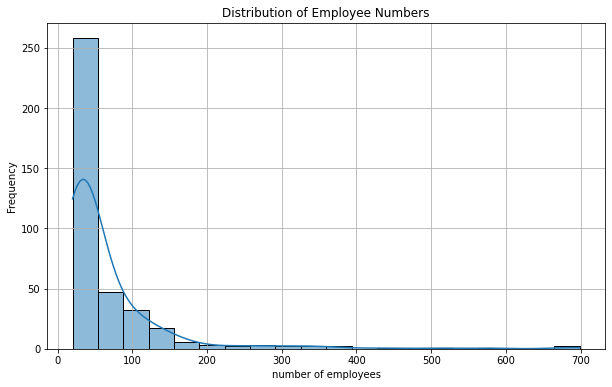

In [ ]:
# visualize employee numbers for companies in the data whuch have at least 20 employees in the data
# Create a histogram of the num_emp column among companies with between 20-1000 employees to understand necessity of similar_company enhancement of similarity_score

import matplotlib.pyplot as plt
import seaborn as sns

# Convert Spark DataFrame to Pandas DataFrame for plotting
df_pd = companies_in_data.select("num_emp").toPandas()

# Create a histogram of the num_emp column
plt.figure(figsize=(10, 6))
sns.histplot(df_pd[df_pd["num_emp"] <= 1000]['num_emp'], bins=20, kde=True)
plt.title("Distribution of Employee Numbers")
plt.xlabel("number of employees")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

In [ ]:
df_by_company.write.option("header", "true").parquet('/FileStore/shared_uploads/naomi.derel@campus.technion.ac.il/company_features_similarities.parquet')
companies_in_data.write.option("header", "true").parquet('/FileStore/shared_uploads/naomi.derel@campus.technion.ac.il/company_features_similarities_small.parquet')